In [15]:
%run features_.ipynb
import re
import numpy as np
import pandas as pd
import mne
from scipy import stats
from sklearn.preprocessing import MinMaxScaler, StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns
import time
import multiprocessing as mp
from joblib import Parallel, delayed
from pandarallel import pandarallel
from entropy import *
from itertools import combinations, permutations
from sklearn import preprocessing
from sklearn.model_selection import cross_val_score
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
import csv
from sklearn.decomposition import PCA
from sklearn.svm import SVC
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant
from sklearn.linear_model import LogisticRegression
from sklearn import tree
from mne_features.feature_extraction import extract_features
from mne_features import *
from scipy import stats

%matplotlib inline

# Parameter

In [16]:
tr_path = "C:/Users/vita7/OneDrive/Documents/Github/EEG_SleepStage_Analysis/data/SC/training_nms/"
te_path = "C:/Users/vita7/OneDrive/Documents/Github/EEG_SleepStage_Analysis/data/SC/testing/"

record_regu = r"SC\d*\D\d\-PSG.edf"
annot_regu = r"SC\d*\D\D\-Hypnogram.edf"

channel_types = {
    'EEG Fpz-Cz': 'eeg',
    'EEG Pz-Oz': 'misc',
    'EOG horizontal': 'misc',
    'Resp oro-nasal': 'misc',
    'EMG submental': 'misc',
    'Temp rectal': 'misc',
    'Event marker': 'misc'
}

sleep_stage = {
    'Sleep stage W': 1,
    'Sleep stage 1': 2,
    'Sleep stage 2': 3,
    'Sleep stage 3': 4,
    'Sleep stage 4': 4,
    'Sleep stage R': 5
}

event_id = {
    'Sleep stage W': 1,
    'Sleep stage 1': 2,
    'Sleep stage 2': 3,
    'Sleep stage 3/4': 4,
    'Sleep stage R': 5,
}

funcs_n = [
    'Mean_frequency','Hjorth_mobility', 'Power', 'STD', 'SpectEn', 'PermEn', 'SVD_En', 'SampEn',
    'AutoCorr', 'Thr75'
]
ratio_n = [
    'EEG Fpz-Cz DOR', 'EEG Fpz-Cz TOR', 'EEG Fpz-Cz AOR', 'EEG Fpz-Cz SOR',
    'EEG Fpz-Cz BOR', 'EEG Fpz-Cz TDR', 'EEG Fpz-Cz ADR', 'EEG Fpz-Cz SDR',
    'EEG Fpz-Cz BDR', 'EEG Fpz-Cz ATR', 'EEG Fpz-Cz STR', 'EEG Fpz-Cz BTR',
    'EEG Fpz-Cz SAR', 'EEG Fpz-Cz BAR', 'EEG Fpz-Cz BSR'
]
six_bands_n = [
    'EEG Fpz-Cz', 'EEG Fpz-Cz Delta', 'EEG Fpz-Cz Theta', 'EEG Fpz-Cz Alpha',
    'EEG Fpz-Cz Sigma', 'EEG Fpz-Cz Beta'
]
frbands_n = six_bands_n + ratio_n

ep_duration = 10.
sfreq = 100.
chs = 1
funcs = 10
frb = 16
partial_bands_func_idx = 9
partial_bands = [[1]]

# DataTransfer

### Record name

In [17]:
record_name = []
annot_name = []

events = []  # events
for file_name in os.listdir(tr_path):
    match1 = re.search(record_regu, file_name)
    match2 = re.search(annot_regu, file_name)
    if (match1):
        record_name.append(match1.group())
    elif (match2):
        annot_name.append(match2.group())

if (len(record_name) != len(annot_name)):
    record_name = []
    annot_name = []

df = pd.concat([pd.DataFrame(record_name), pd.DataFrame(annot_name)], axis=1)
df.columns = ['Records', 'Hypnogram']
df

,Records,Hypnogram
0,SC4001E0-PSG.edf,SC4001EC-Hypnogram.edf
1,SC4051E0-PSG.edf,SC4051EC-Hypnogram.edf
2,SC4151E0-PSG.edf,SC4151EC-Hypnogram.edf
3,SC4182E0-PSG.edf,SC4182EC-Hypnogram.edf
4,SC4312E0-PSG.edf,SC4312EM-Hypnogram.edf
5,SC4451F0-PSG.edf,SC4451FY-Hypnogram.edf
6,SC4592G0-PSG.edf,SC4592GY-Hypnogram.edf
7,SC4812G0-PSG.edf,SC4812GV-Hypnogram.edf


### Read data

In [18]:
raw_ = []  # raw
events_ = []  # events

for ren, an in zip(record_name, annot_name):
    print('\n\033[5;31;47m File name:\n %s\033[0m\n' % (ren))
    rec = mne.io.read_raw_edf(tr_path + ren, preload=True)
    ann = mne.read_annotations(tr_path + an)

    # set annotations
    rec.set_annotations(ann, emit_warning=True)
    rec.set_channel_types(channel_types)
    rec.filter(0.5, 30, picks=['eeg'])
    ev, _ = mne.events_from_annotations(rec,
                                        use_rounding=False,
                                        event_id=sleep_stage,
                                        chunk_duration=ep_duration)

    events_.append(ev)
    raw_.append(rec)


 File name:
 SC4001E0-PSG.edf

Extracting EDF parameters from C:\Users\vita7\OneDrive\Documents\Github\EEG_SleepStage_Analysis\data\SC\training_nms\SC4001E0-PSG.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 7949999  =      0.000 ... 79499.990 secs...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 661 samples (6.610 sec)



<ipython-input-18-4c5fbb1b6727>:10: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  rec.set_annotations(ann, emit_warning=True)


Used Annotations descriptions: ['Sleep stage 1', 'Sleep stage 2', 'Sleep stage 3', 'Sleep stage 4', 'Sleep stage R', 'Sleep stage W']

 File name:
 SC4051E0-PSG.edf

Extracting EDF parameters from C:\Users\vita7\OneDrive\Documents\Github\EEG_SleepStage_Analysis\data\SC\training_nms\SC4051E0-PSG.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 8165999  =      0.000 ... 81659.990 secs...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 661 samples (6.61

<ipython-input-18-4c5fbb1b6727>:10: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  rec.set_annotations(ann, emit_warning=True)


Used Annotations descriptions: ['Sleep stage 1', 'Sleep stage 2', 'Sleep stage 3', 'Sleep stage 4', 'Sleep stage R', 'Sleep stage W']

 File name:
 SC4151E0-PSG.edf

Extracting EDF parameters from C:\Users\vita7\OneDrive\Documents\Github\EEG_SleepStage_Analysis\data\SC\training_nms\SC4151E0-PSG.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 7859999  =      0.000 ... 78599.990 secs...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 661 samples (6.61

<ipython-input-18-4c5fbb1b6727>:10: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  rec.set_annotations(ann, emit_warning=True)


Used Annotations descriptions: ['Sleep stage 1', 'Sleep stage 2', 'Sleep stage 3', 'Sleep stage 4', 'Sleep stage R', 'Sleep stage W']

 File name:
 SC4182E0-PSG.edf

Extracting EDF parameters from C:\Users\vita7\OneDrive\Documents\Github\EEG_SleepStage_Analysis\data\SC\training_nms\SC4182E0-PSG.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 8525999  =      0.000 ... 85259.990 secs...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 661 samples (6.61

<ipython-input-18-4c5fbb1b6727>:10: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  rec.set_annotations(ann, emit_warning=True)


Used Annotations descriptions: ['Sleep stage 1', 'Sleep stage 2', 'Sleep stage 3', 'Sleep stage 4', 'Sleep stage R', 'Sleep stage W']

 File name:
 SC4312E0-PSG.edf

Extracting EDF parameters from C:\Users\vita7\OneDrive\Documents\Github\EEG_SleepStage_Analysis\data\SC\training_nms\SC4312E0-PSG.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 8099999  =      0.000 ... 80999.990 secs...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 661 samples (6.61

<ipython-input-18-4c5fbb1b6727>:10: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  rec.set_annotations(ann, emit_warning=True)


Used Annotations descriptions: ['Sleep stage 1', 'Sleep stage 2', 'Sleep stage 3', 'Sleep stage 4', 'Sleep stage R', 'Sleep stage W']

 File name:
 SC4451F0-PSG.edf

Extracting EDF parameters from C:\Users\vita7\OneDrive\Documents\Github\EEG_SleepStage_Analysis\data\SC\training_nms\SC4451F0-PSG.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 8369999  =      0.000 ... 83699.990 secs...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 661 samples (6.61

<ipython-input-18-4c5fbb1b6727>:10: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  rec.set_annotations(ann, emit_warning=True)


Used Annotations descriptions: ['Sleep stage 1', 'Sleep stage 2', 'Sleep stage 3', 'Sleep stage 4', 'Sleep stage R', 'Sleep stage W']

 File name:
 SC4592G0-PSG.edf

Extracting EDF parameters from C:\Users\vita7\OneDrive\Documents\Github\EEG_SleepStage_Analysis\data\SC\training_nms\SC4592G0-PSG.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 6119999  =      0.000 ... 61199.990 secs...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 661 samples (6.61

<ipython-input-18-4c5fbb1b6727>:10: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  rec.set_annotations(ann, emit_warning=True)


Used Annotations descriptions: ['Sleep stage 1', 'Sleep stage 2', 'Sleep stage 3', 'Sleep stage 4', 'Sleep stage R', 'Sleep stage W']

 File name:
 SC4812G0-PSG.edf

Extracting EDF parameters from C:\Users\vita7\OneDrive\Documents\Github\EEG_SleepStage_Analysis\data\SC\training_nms\SC4812G0-PSG.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 7247999  =      0.000 ... 72479.990 secs...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 661 samples (6.61

<ipython-input-18-4c5fbb1b6727>:10: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  rec.set_annotations(ann, emit_warning=True)


Used Annotations descriptions: ['Sleep stage 1', 'Sleep stage 2', 'Sleep stage 3', 'Sleep stage 4', 'Sleep stage R', 'Sleep stage W']


### EP records

In [19]:
epochs_ = []
tmax = ep_duration - 1 / rec.info['sfreq']
for raw, eve in zip(raw_, events_):
    ep = mne.Epochs(
        raw=raw,
        picks=['eeg'],
        events=eve,
        event_id=event_id,
        tmin=0.,
        tmax=tmax,
        baseline=None,  # 1 epoch data - mean ( 1 epoch data)
        detrend=None,  # linear detrend
    )
    epochs_.append(ep)

7950 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
8166 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
7848 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
8526 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
8100 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
8370 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
6120 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
7242 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated


### EP Dataframe

In [20]:
ep_df_ = []
for eps in epochs_:
    df = eps.to_data_frame()

    # data balance
    con_len = list(
        df.groupby(level=['condition']).count()['EEG Fpz-Cz'] /
        (ep_duration * sfreq))  # epochs
    drop_len = np.floor(con_len[-1] - np.mean(con_len[:4]))  # epochs
    df = df[int(np.floor(drop_len / 2) *
                (ep_duration * sfreq)):int((np.sum(con_len) -
                                            np.floor(drop_len / 2)) *
                                           (ep_duration * sfreq))]

    # 5 frequency bands
    df['EEG Fpz-Cz Delta'] = mne.filter.filter_data(df['EEG Fpz-Cz'],
                                                    sfreq=100,
                                                    l_freq=0.5,
                                                    h_freq=4.5)
    df['EEG Fpz-Cz Theta'] = mne.filter.filter_data(df['EEG Fpz-Cz'],
                                                    sfreq=100,
                                                    l_freq=4.5,
                                                    h_freq=8.5)
    df['EEG Fpz-Cz Alpha'] = mne.filter.filter_data(df['EEG Fpz-Cz'],
                                                    sfreq=100,
                                                    l_freq=8.5,
                                                    h_freq=11.5)
    df['EEG Fpz-Cz Sigma'] = mne.filter.filter_data(df['EEG Fpz-Cz'],
                                                    sfreq=100,
                                                    l_freq=11.5,
                                                    h_freq=15.5)
    df['EEG Fpz-Cz Beta'] = mne.filter.filter_data(df['EEG Fpz-Cz'],
                                                   sfreq=100,
                                                   l_freq=15.5,
                                                   h_freq=30)

    ep_df_.append(df)

Loading data for 7950 events and 1000 original time points ...
0 bad epochs dropped
Converting "time" to "<class 'numpy.int64'>"...
Setting up band-pass filter from 0.5 - 4.5 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 4.50 Hz
- Upper transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 5.50 Hz)
- Filter length: 661 samples (6.610 sec)

Setting up band-pass filter from 4.5 - 8.5 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 4.50
- Lower transition bandwidth: 2.00 Hz (-6 dB 


Loading data for 8526 events and 1000 original time points ...
0 bad epochs dropped
Converting "time" to "<class 'numpy.int64'>"...
Setting up band-pass filter from 0.5 - 4.5 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 4.50 Hz
- Upper transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 5.50 Hz)
- Filter length: 661 samples (6.610 sec)

Setting up band-pass filter from 4.5 - 8.5 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 4.50
- Lower transition bandwidth: 2.00 Hz (-6 dB


Loading data for 6120 events and 1000 original time points ...
0 bad epochs dropped
Converting "time" to "<class 'numpy.int64'>"...
Setting up band-pass filter from 0.5 - 4.5 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 4.50 Hz
- Upper transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 5.50 Hz)
- Filter length: 661 samples (6.610 sec)

Setting up band-pass filter from 4.5 - 8.5 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 4.50
- Lower transition bandwidth: 2.00 Hz (-6 dB

# Information

In [21]:
for df in ep_df_:
    print(df.info())

<class 'pandas.core.frame.DataFrame'>
MultiIndex: 2450000 entries, (Sleep stage W, 2750, 0) to (Sleep stage W, 5199, 9990)
Data columns (total 6 columns):
EEG Fpz-Cz          float64
EEG Fpz-Cz Delta    float64
EEG Fpz-Cz Theta    float64
EEG Fpz-Cz Alpha    float64
EEG Fpz-Cz Sigma    float64
EEG Fpz-Cz Beta     float64
dtypes: float64(6)
memory usage: 123.9+ MB
None
<class 'pandas.core.frame.DataFrame'>
MultiIndex: 1740000 entries, (Sleep stage W, 3213, 0) to (Sleep stage 3/4, 4952, 9990)
Data columns (total 6 columns):
EEG Fpz-Cz          float64
EEG Fpz-Cz Delta    float64
EEG Fpz-Cz Theta    float64
EEG Fpz-Cz Alpha    float64
EEG Fpz-Cz Sigma    float64
EEG Fpz-Cz Beta     float64
dtypes: float64(6)
memory usage: 88.0+ MB
None
<class 'pandas.core.frame.DataFrame'>
MultiIndex: 2926000 entries, (Sleep stage W, 2461, 0) to (Sleep stage W, 5386, 9990)
Data columns (total 6 columns):
EEG Fpz-Cz          float64
EEG Fpz-Cz Delta    float64
EEG Fpz-Cz Theta    float64
EEG Fpz-Cz Alpha  

In [22]:
temp = pd.DataFrame()
for df in ep_df_:
    temp = pd.concat(
        [temp,
         df.groupby(level=['condition']).count()['EEG Fpz-Cz'] / 1000.],
        axis=1)
temp.columns = record_name
temp = temp.T
temp['total'] = np.sum(temp, axis=1)
temp

C:\Users\vita7\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  


condition,Sleep stage 1,Sleep stage 2,Sleep stage 3/4,Sleep stage R,Sleep stage W,total
SC4001E0-PSG.edf,159.0,750.0,660.0,375.0,506.0,2450.0
SC4051E0-PSG.edf,93.0,405.0,255.0,132.0,855.0,1740.0
SC4151E0-PSG.edf,123.0,1062.0,531.0,624.0,586.0,2926.0
SC4182E0-PSG.edf,453.0,870.0,648.0,348.0,581.0,2900.0
SC4312E0-PSG.edf,374.0,828.0,573.0,573.0,908.0,3256.0
SC4451F0-PSG.edf,459.0,696.0,921.0,336.0,1110.0,3522.0
SC4592G0-PSG.edf,270.0,426.0,168.0,180.0,1684.0,2728.0
SC4812G0-PSG.edf,204.0,658.0,300.0,240.0,1318.0,2720.0


In [23]:
temp = []

for df in ep_df_:
    temp.append(df.describe())

des = pd.concat(temp,axis=0,keys=range(8))
des.to_csv('training_record_des.csv')
des

channel    EEG Fpz-Cz  EEG Fpz-Cz Delta  EEG Fpz-Cz Theta  EEG Fpz-Cz Alpha  \
0 count  2.450000e+06      2.450000e+06      2.450000e+06      2.450000e+06   
  mean  -1.464151e-04     -4.234948e-04      3.350748e-06      7.645613e-08   
  std    2.225614e+01      2.119256e+01      6.166780e+00      2.893816e+00   
  min   -1.723292e+02     -1.572540e+02     -6.707452e+01     -2.613432e+01   
  25%   -1.014009e+01     -9.057221e+00     -3.461199e+00     -1.698791e+00   
...               ...               ...               ...               ...   
7 min   -2.432362e+02     -1.857230e+02     -8.715047e+01     -9.397412e+01   
  25%   -1.183394e+01     -9.646928e+00     -4.153630e+00     -3.005921e+00   
  50%   -4.147775e-02     -8.738605e-02     -2.586870e-02      1.341400e-03   
  75%    1.221247e+01      9.924595e+00      4.110295e+00      3.002331e+00   
  max    2.497085e+02      1.814916e+02      8.041448e+01      9.628029e+01   

channel  EEG Fpz-Cz Sigma  EEG Fpz-Cz Beta  
0 count      2.450000e+06     2.450000e+06  
  mean       1.798825e-06     4.686691e-07  
  std        2.325913e+00     2.124788e+00  
  min       -2.635743e+01    -5.579469e+01  
  25%       -1.233488e+00    -1.053866e+00  
...                   ...              ...  
7 min       -1.132114e+02    -1.844483e+02  
  25%       -2.411248e+00    -2.557321e+00  
  50%       -3.692631e-04     7.544974e-03  
  75%        2.410715e+00     2.561843e+00  
  max        1.103354e+02     1.767832e+02  

[64 rows x 6 columns]

# RAW Preprocessing

### Spectrum

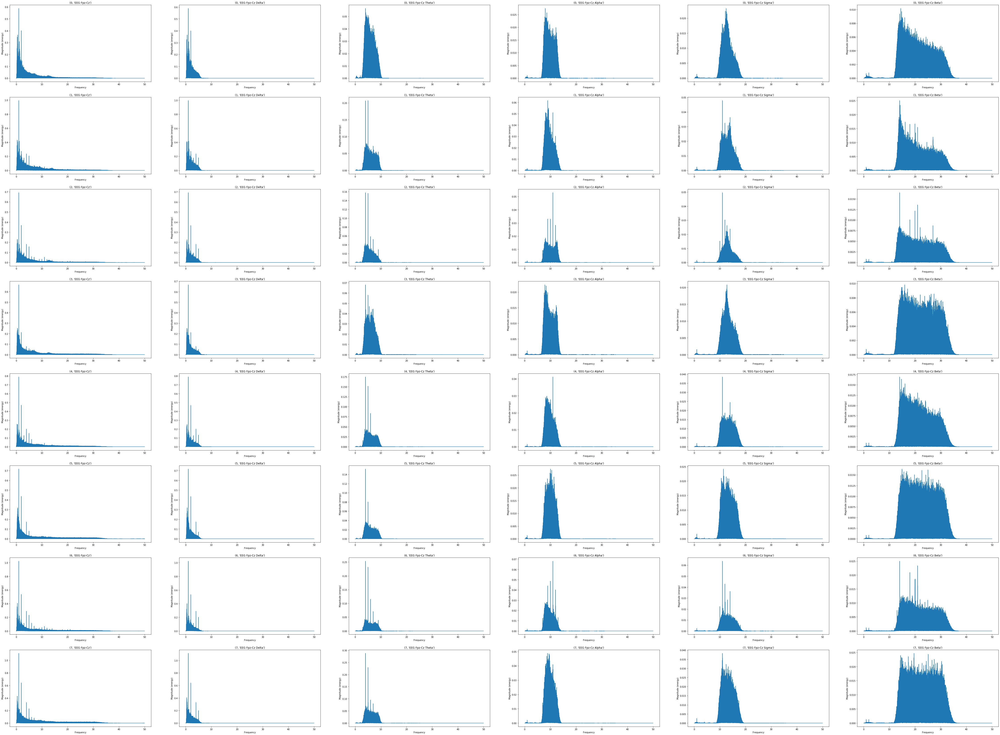

In [24]:
fig, axes = plt.subplots(nrows=8, ncols=6, figsize=(80, 60))

for df, n in zip(ep_df_, range(len(ep_df_))):
    clist = list(df.columns)
    for c in clist:
        axes[n, clist.index(c)].set_title((n, c))
        axes[n, clist.index(c)].magnitude_spectrum(np.array(df[c]), Fs=sfreq)

plt.savefig('Magnitude Spectrum.png')

In [25]:
ep_df_[0].to_csv('test.csv')

# Features calculation

In [26]:
# multi processing
def applyParallel(dfGrouped, func):
    retLst = Parallel(n_jobs=mp.cpu_count())(delayed(func)(group)
                                             for name, group in dfGrouped)
    return pd.concat(retLst, axis=1).T

"""Functions format.

1. MNE - features : univariate

    temps.append(
        applyParallel(
            grouped,
            lambda x: pd.Series(univariate.compute_XXX(x.T.values))).set_index(midx))

2. NUMPY

    temps.append(grouped.XXX(PPP))

3. STATS

    temps.append(
    applyParallel(
        grouped,
        lambda x: x.apply(stats.XXX,PPP,axis=0)).set_index(midx))

4. Entropy
    temps.append(
        applyParallel(
            grouped, lambda x: x.apply(XXX,PPP,axis=0)).set_index(midx))

5. USER DEF

    temps.append(
        applyParallel(
            grouped, lambda x: x.apply(XXX,PPP,,axis=0)).set_index(midx))
"""

In [27]:
def Features_Calculate(df, f=None, b=None):
    grouped = df.groupby(level=['epoch', 'condition'])
    temps = []
    midx = []

    # multiIndex
    for idx, gr in grouped:
        midx.append(idx)
    midx = pd.MultiIndex.from_tuples(midx, names=('epoch', 'condition'))
    """---------------------------------------------------------------------------------------------------------------------------"""
    temps.append(
        applyParallel(
            grouped, lambda x: x.apply(Mean_frequency, axis=0)).set_index(midx))
    
    temps.append(
        applyParallel(
            grouped, lambda x: pd.Series(
                univariate.compute_hjorth_mobility(x.T.values))).set_index(midx))

    # Power
    temps.append(
        applyParallel(
            grouped,
            lambda x: x.apply(Power, sfreq=sfreq, axis=0)).set_index(midx))

    # STD
    temps.append(grouped.std())

    # SpectEn
    temps.append(
        applyParallel(
            grouped, lambda x: x.apply(spectral_entropy,
                                       sf=sfreq,
                                       method='welch',
                                       normalize=False,
                                       axis=0)).set_index(midx))

    # PermEn
    temps.append(
        applyParallel(
            grouped, lambda x: x.apply(perm_entropy, order=3, delay=1, axis=0)
        ).set_index(midx))

    # SVD_En
    temps.append(
        applyParallel(
            grouped, lambda x: x.apply(
                svd_entropy, order=3, delay=1, normalize=False, axis=0)).
        set_index(midx))

    # SampEn
    temps.append(
        applyParallel(
            grouped,
            lambda x: x.apply(sample_entropy, order=2, axis=0)).set_index(
                midx))

    # USER DEF
    temps.append(
        applyParallel(
            grouped, lambda x: x.apply(AutoCorr, k=1, axis=0)).set_index(midx))
    """---------------------------------------------------------------------------------------------------------------------------"""

    temps.append(
        applyParallel(grouped,
                      lambda x: x.apply(ThresholdVol, thr=75, axis=0))[[
                          six_bands_n[i] for i in b[0]
                      ]].set_index(midx))
    """---------------------------------------------------------------------------------------------------------------------------"""

    res = pd.concat(temps, axis=1)

    if (f == b == None):
        cols = [(i, j) for i in funcs_n[:f] for j in six_bands_n]
    else:
        cols = [(i, j) for i in funcs_n[:f] for j in six_bands_n] + [
            (i, j) for i in funcs_n[f:]
            for j in [six_bands_n[k] for k in b[list.index(funcs_n, i) - f]]
        ]
    res.columns = pd.MultiIndex.from_tuples(tuples=cols,
                                            names=['Function', 'Band'])

    return res

In [28]:
temp = []

st = time.time()
for df in ep_df_:
    temp.append(
        Features_Calculate(df, f=partial_bands_func_idx, b=partial_bands))
tr_df = pd.concat(temp, axis=0)

et = time.time()
print('time-consuming: %f' % (et - st))

C:\Users\vita7\Anaconda3\lib\site-packages\joblib\externals\loky\process_executor.py:706: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  "timeout or by a memory leak.", UserWarning


time-consuming: 508.843732


In [29]:
tr_df = pd.concat(temp, axis=0)
tr_df.head()

Function            Mean_frequency                                    \
Band                    EEG Fpz-Cz EEG Fpz-Cz Delta EEG Fpz-Cz Theta   
epoch condition                                                        
2750  Sleep stage W       1.664953         1.272789         5.157914   
2751  Sleep stage W       2.557418         1.775817         4.964304   
2752  Sleep stage W       2.241108         1.716855         5.043503   
2753  Sleep stage W       2.232030         1.355480         5.412811   
2754  Sleep stage W       2.296112         1.667506         5.321712   

Function                                                               \
Band                EEG Fpz-Cz Alpha EEG Fpz-Cz Sigma EEG Fpz-Cz Beta   
epoch condition                                                         
2750  Sleep stage W         9.697337        13.037134       22.958127   
2751  Sleep stage W         9.821403        13.130978       22.750405   
2752  Sleep stage W         9.556272        12.923802       22.410906   
2753  Sleep stage W         9.615211        13.262419       23.225215   
2754  Sleep stage W         9.237686        13.734931       22.261370   

Function            Hjorth_mobility                                    \
Band                     EEG Fpz-Cz EEG Fpz-Cz Delta EEG Fpz-Cz Theta   
epoch condition                                                         
2750  Sleep stage W        0.210770         0.108411         0.333452   
2751  Sleep stage W        0.265567         0.135344         0.323986   
2752  Sleep stage W        0.225223         0.130442         0.321501   
2753  Sleep stage W        0.265103         0.115991         0.344513   
2754  Sleep stage W        0.245674         0.143645         0.344098   

Function                              ...           SampEn                   \
Band                EEG Fpz-Cz Alpha  ... EEG Fpz-Cz Alpha EEG Fpz-Cz Sigma   
epoch condition                       ...                                     
2750  Sleep stage W         0.600818  ...         0.622485         0.755880   
2751  Sleep stage W         0.609243  ...         0.628287         0.740053   
2752  Sleep stage W         0.597755  ...         0.616738         0.725153   
2753  Sleep stage W         0.599916  ...         0.611738         0.698729   
2754  Sleep stage W         0.582714  ...         0.617204         0.752756   

Function                              AutoCorr                   \
Band                EEG Fpz-Cz Beta EEG Fpz-Cz EEG Fpz-Cz Delta   
epoch condition                                                   
2750  Sleep stage W        1.617767   0.977667         0.994010   
2751  Sleep stage W        1.534523   0.965642         0.991236   
2752  Sleep stage W        1.486089   0.974621         0.991409   
2753  Sleep stage W        1.196411   0.963653         0.991792   
2754  Sleep stage W        1.635461   0.973309         0.993970   

Function                                                                \
Band                EEG Fpz-Cz Theta EEG Fpz-Cz Alpha EEG Fpz-Cz Sigma   
epoch condition                                                          
2750  Sleep stage W         0.943813         0.819424         0.669260   
2751  Sleep stage W         0.948917         0.814643         0.666057   
2752  Sleep stage W         0.947258         0.821590         0.679827   
2753  Sleep stage W         0.941834         0.819554         0.663158   
2754  Sleep stage W         0.942251         0.831757         0.645630   

Function                                       Thr75  
Band                EEG Fpz-Cz Beta EEG Fpz-Cz Delta  
epoch condition                                       
2750  Sleep stage W        0.124444               23  
2751  Sleep stage W        0.132910                1  
2752  Sleep stage W        0.159802                1  
2753  Sleep stage W        0.106962                1  
2754  Sleep stage W        0.163811                6  

[5 rows x 55 columns]

# Preprocessing

### 1. Missing value dection.
### 2. Inf value dection.
### 3. Shifting
### 4. Generate the ratio bands.

In [30]:
tr_df.describe().to_csv('des_0.csv')
tr_df.describe()

Function Mean_frequency                                                     \
Band         EEG Fpz-Cz EEG Fpz-Cz Delta EEG Fpz-Cz Theta EEG Fpz-Cz Alpha   
count      22242.000000     22242.000000     22242.000000     22242.000000   
mean           3.438913         1.494005         5.840268         9.696116   
std            2.357236         0.421669         0.628164         0.466135   
min            0.503860         0.409534         4.488445         7.812555   
25%            1.845350         1.182392         5.383178         9.403003   
50%            2.778780         1.457934         5.710900         9.692419   
75%            4.155882         1.770734         6.165032         9.985123   
max           18.763078         3.322755         8.317155        11.833860   

Function                                  Hjorth_mobility                   \
Band     EEG Fpz-Cz Sigma EEG Fpz-Cz Beta      EEG Fpz-Cz EEG Fpz-Cz Delta   
count        22242.000000    22242.000000    22242.000000     22242.000000   
mean            13.046022       20.596907        0.329373         0.122106   
std              0.486806        1.971186        0.173170         0.027107   
min             11.044345       15.211463        0.050370         0.041031   
25%             12.710822       19.061411        0.205494         0.102112   
50%             13.049288       20.742704        0.287967         0.120816   
75%             13.389384       22.166097        0.400406         0.140966   
max             14.886093       26.862862        1.126451         0.233315   

Function                                    ...           SampEn  \
Band     EEG Fpz-Cz Theta EEG Fpz-Cz Alpha  ... EEG Fpz-Cz Alpha   
count        22242.000000     22242.000000  ...     22242.000000   
mean             0.377792         0.606094  ...         0.605835   
std              0.037749         0.027557  ...         0.035369   
min              0.298147         0.489714  ...         0.111053   
25%              0.350431         0.589078  ...         0.587579   
50%              0.370306         0.606422  ...         0.609001   
75%              0.397584         0.623089  ...         0.627626   
max              0.518735         0.720693  ...         0.738411   

Function                                       AutoCorr                   \
Band     EEG Fpz-Cz Sigma EEG Fpz-Cz Beta    EEG Fpz-Cz EEG Fpz-Cz Delta   
count        22242.000000    22242.000000  22242.000000     22242.000000   
mean             0.681038        1.522441      0.931278         0.992700   
std              0.097235        0.172021      0.080866         0.003731   
min              0.101745        0.090224      0.365749         0.935077   
25%              0.615580        1.449569      0.920172         0.990476   
50%              0.693246        1.555192      0.959073         0.993209   
75%              0.751819        1.635123      0.979357         0.995304   
max              1.040972        1.869123      1.003181         1.017139   

Function                                                                     \
Band     EEG Fpz-Cz Theta EEG Fpz-Cz Alpha EEG Fpz-Cz Sigma EEG Fpz-Cz Beta   
count        22242.000000     22242.000000     22242.000000    22242.000000   
mean             0.928446         0.816471         0.677700        0.261431   
std              0.014989         0.016772         0.021917        0.114816   
min              0.864745         0.741115         0.599653       -0.108120   
25%              0.921503         0.806446         0.662197        0.168948   
50%              0.931890         0.816698         0.677551        0.253964   
75%              0.939149         0.827029         0.693165        0.353846   
max              0.970999         0.880498         0.759090        0.564694   

Function            Thr75  
Band     EEG Fpz-Cz Delta  
count        22242.000000  
mean             4.673905  
std             12.212192  
min              1.000000  
25%              1.000000  
50%      

In [31]:
# inf value processing
tr_df.replace([np.inf,-np.inf],np.nan,inplace = True)
# missing value processing
tr_df.dropna(inplace=True)

In [32]:
# Shifting
for col in tr_df.columns:
    if (tr_df[[col]].min()[0] <= 0):
        tr_df[[col]] = tr_df[[col]] + 1 + tr_df[[col]].min()[0]

In [33]:
# Feature cross
lev1_comblist = list(
    combinations(list(tr_df.columns.get_level_values(1).unique()), r=2))
ls = list(tr_df.columns.get_level_values(0).unique())[:partial_bands_func_idx]

for fes in ls:
    cInd = int((ls.index(fes)+1)*len(six_bands_n)+ls.index(fes)*len(ratio_n))

    i = 0
    for rn, coms in zip(ratio_n, lev1_comblist):
        ncol = (fes,rn)
        nval = tr_df[(fes, coms[1])] / tr_df[(fes, coms[0])]
        tr_df.insert(loc=(cInd + i), column=ncol, value=nval)
        i = i + 1

In [34]:
tr_df.head()

Function            Mean_frequency                                    \
Band                    EEG Fpz-Cz EEG Fpz-Cz Delta EEG Fpz-Cz Theta   
epoch condition                                                        
2750  Sleep stage W       1.664953         1.272789         5.157914   
2751  Sleep stage W       2.557418         1.775817         4.964304   
2752  Sleep stage W       2.241108         1.716855         5.043503   
2753  Sleep stage W       2.232030         1.355480         5.412811   
2754  Sleep stage W       2.296112         1.667506         5.321712   

Function                                                               \
Band                EEG Fpz-Cz Alpha EEG Fpz-Cz Sigma EEG Fpz-Cz Beta   
epoch condition                                                         
2750  Sleep stage W         9.697337        13.037134       22.958127   
2751  Sleep stage W         9.821403        13.130978       22.750405   
2752  Sleep stage W         9.556272        12.923802       22.410906   
2753  Sleep stage W         9.615211        13.262419       23.225215   
2754  Sleep stage W         9.237686        13.734931       22.261370   

Function                                                          \
Band                EEG Fpz-Cz DOR EEG Fpz-Cz TOR EEG Fpz-Cz AOR   
epoch condition                                                    
2750  Sleep stage W       0.764460       3.097934       5.824392   
2751  Sleep stage W       0.694379       1.941139       3.840358   
2752  Sleep stage W       0.766074       2.250451       4.264084   
2753  Sleep stage W       0.607286       2.425062       4.307833   
2754  Sleep stage W       0.726230       2.317706       4.023185   

Function                            ...       AutoCorr                 \
Band                EEG Fpz-Cz SOR  ... EEG Fpz-Cz ADR EEG Fpz-Cz SDR   
epoch condition                     ...                                 
2750  Sleep stage W       7.830333  ...       0.824361       0.673293   
2751  Sleep stage W       5.134466  ...       0.821846       0.671946   
2752  Sleep stage W       5.766702  ...       0.828709       0.685718   
2753  Sleep stage W       5.941865  ...       0.826336       0.668646   
2754  Sleep stage W       5.981820  ...       0.836802       0.649547   

Function                                                          \
Band                EEG Fpz-Cz BDR EEG Fpz-Cz ATR EEG Fpz-Cz STR   
epoch condition                                                    
2750  Sleep stage W       1.022449       0.868205       0.709102   
2751  Sleep stage W       1.033851       0.858498       0.701913   
2752  Sleep stage W       1.060795       0.867335       0.717679   
2753  Sleep stage W       1.007109       0.870169       0.704113   
2754  Sleep stage W       1.062096       0.882734       0.685200   

Function                                                          \
Band                EEG Fpz-Cz BTR EEG Fpz-Cz SAR EEG Fpz-Cz BAR   
epoch condition                                                    
2750  Sleep stage W       1.076828       0.816745       1.240292   
2751  Sleep stage W       1.079958       0.817606       1.257962   
2752  Sleep stage W       1.110239       0.827453       1.280057   
2753  Sleep stage W       1.060530       0.809169       1.218764   
2754  Sleep stage W       1.120393       0.776225       1.269231   

Function                                      Thr75  
Band                EEG Fpz-Cz BSR EEG Fpz-Cz Delta  
epoch condition                                      
2750  Sleep stage W       1.518580               23  
2751  Sleep stage W       1.538592                1  
2752  Sleep stage W       1.546986                1  
2753  Sleep stage W       1.506192                1  
2754  Sleep stage W       1.635134                6  

[5 rows x 190 columns]

In [35]:
tr_df.describe().to_csv('des_1.csv')
tr_df.describe()

Function Mean_frequency                                                     \
Band         EEG Fpz-Cz EEG Fpz-Cz Delta EEG Fpz-Cz Theta EEG Fpz-Cz Alpha   
count      22242.000000     22242.000000     22242.000000     22242.000000   
mean           3.438913         1.494005         5.840268         9.696116   
std            2.357236         0.421669         0.628164         0.466135   
min            0.503860         0.409534         4.488445         7.812555   
25%            1.845350         1.182392         5.383178         9.403003   
50%            2.778780         1.457934         5.710900         9.692419   
75%            4.155882         1.770734         6.165032         9.985123   
max           18.763078         3.322755         8.317155        11.833860   

Function                                                                 \
Band     EEG Fpz-Cz Sigma EEG Fpz-Cz Beta EEG Fpz-Cz DOR EEG Fpz-Cz TOR   
count        22242.000000    22242.000000   22242.000000   22242.000000   
mean            13.046022       20.596907       0.548863       2.338421   
std              0.486806        1.971186       0.206543       1.252853   
min             11.044345       15.211463       0.083361       0.333583   
25%             12.710822       19.061411       0.389697       1.426861   
50%             13.049288       20.742704       0.566618       2.063768   
75%             13.389384       22.166097       0.711698       3.049897   
max             14.886093       26.862862       1.062068      13.109798   

Function                                ...       AutoCorr                 \
Band     EEG Fpz-Cz AOR EEG Fpz-Cz SOR  ... EEG Fpz-Cz ADR EEG Fpz-Cz SDR   
count      22242.000000   22242.000000  ...   22242.000000   22242.000000   
mean           3.979713       5.303990  ...       0.822488       0.682676   
std            2.242203       2.900608  ...       0.017274       0.021694   
min            0.531484       0.742933  ...       0.744939       0.601257   
25%            2.312625       3.161686  ...       0.811985       0.667201   
50%            3.503472       4.698565  ...       0.822461       0.682820   
75%            5.275943       6.970647  ...       0.833139       0.698163   
max           19.313247      25.894667  ...       0.886527       0.766947   

Function                                                              \
Band     EEG Fpz-Cz BDR EEG Fpz-Cz ATR EEG Fpz-Cz STR EEG Fpz-Cz BTR   
count      22242.000000   22242.000000   22242.000000   22242.000000   
mean           1.161804       0.879766       0.730083       1.242365   
std            0.115708       0.028024       0.025407       0.123322   
min            0.790572       0.783633       0.646587       0.827583   
25%            1.068582       0.862144       0.712576       1.142238   
50%            1.154645       0.876027       0.729487       1.240522   
75%            1.254055       0.893948       0.746007       1.343395   
max            1.472345       0.986923       0.855083       1.595306   

Function                                                         Thr75  
Band     EEG Fpz-Cz SAR EEG Fpz-Cz BAR EEG Fpz-Cz BSR EEG Fpz-Cz Delta  
count      22242.000000   22242.000000   22242.000000     22242.000000  
mean           0.830489       1.413592       1.701512         4.673905  
std            0.034509       0.149105       0.158090        12.212192  
min            0.701753       0.952060       1.204241         1.000000  
25%            0.806190       1.293121       1.578622         1.000000  
50%            0.826717       1.392247       1.686323         1.000000  
75%            0.853005       1.526615       1.814008         1.000000  
max            0.947497       1.910291       2.234006       236.000000  

[8 rows x 190 columns]

In [36]:
# inf value processing
tr_df.replace([np.inf,-np.inf],np.nan,inplace = True)
# missing value processing
tr_df.dropna(inplace=True)

In [37]:
tr_df.describe().to_csv('des_2.csv')
tr_df.describe()

Function Mean_frequency                                                     \
Band         EEG Fpz-Cz EEG Fpz-Cz Delta EEG Fpz-Cz Theta EEG Fpz-Cz Alpha   
count      22242.000000     22242.000000     22242.000000     22242.000000   
mean           3.438913         1.494005         5.840268         9.696116   
std            2.357236         0.421669         0.628164         0.466135   
min            0.503860         0.409534         4.488445         7.812555   
25%            1.845350         1.182392         5.383178         9.403003   
50%            2.778780         1.457934         5.710900         9.692419   
75%            4.155882         1.770734         6.165032         9.985123   
max           18.763078         3.322755         8.317155        11.833860   

Function                                                                 \
Band     EEG Fpz-Cz Sigma EEG Fpz-Cz Beta EEG Fpz-Cz DOR EEG Fpz-Cz TOR   
count        22242.000000    22242.000000   22242.000000   22242.000000   
mean            13.046022       20.596907       0.548863       2.338421   
std              0.486806        1.971186       0.206543       1.252853   
min             11.044345       15.211463       0.083361       0.333583   
25%             12.710822       19.061411       0.389697       1.426861   
50%             13.049288       20.742704       0.566618       2.063768   
75%             13.389384       22.166097       0.711698       3.049897   
max             14.886093       26.862862       1.062068      13.109798   

Function                                ...       AutoCorr                 \
Band     EEG Fpz-Cz AOR EEG Fpz-Cz SOR  ... EEG Fpz-Cz ADR EEG Fpz-Cz SDR   
count      22242.000000   22242.000000  ...   22242.000000   22242.000000   
mean           3.979713       5.303990  ...       0.822488       0.682676   
std            2.242203       2.900608  ...       0.017274       0.021694   
min            0.531484       0.742933  ...       0.744939       0.601257   
25%            2.312625       3.161686  ...       0.811985       0.667201   
50%            3.503472       4.698565  ...       0.822461       0.682820   
75%            5.275943       6.970647  ...       0.833139       0.698163   
max           19.313247      25.894667  ...       0.886527       0.766947   

Function                                                              \
Band     EEG Fpz-Cz BDR EEG Fpz-Cz ATR EEG Fpz-Cz STR EEG Fpz-Cz BTR   
count      22242.000000   22242.000000   22242.000000   22242.000000   
mean           1.161804       0.879766       0.730083       1.242365   
std            0.115708       0.028024       0.025407       0.123322   
min            0.790572       0.783633       0.646587       0.827583   
25%            1.068582       0.862144       0.712576       1.142238   
50%            1.154645       0.876027       0.729487       1.240522   
75%            1.254055       0.893948       0.746007       1.343395   
max            1.472345       0.986923       0.855083       1.595306   

Function                                                         Thr75  
Band     EEG Fpz-Cz SAR EEG Fpz-Cz BAR EEG Fpz-Cz BSR EEG Fpz-Cz Delta  
count      22242.000000   22242.000000   22242.000000     22242.000000  
mean           0.830489       1.413592       1.701512         4.673905  
std            0.034509       0.149105       0.158090        12.212192  
min            0.701753       0.952060       1.204241         1.000000  
25%            0.806190       1.293121       1.578622         1.000000  
50%            0.826717       1.392247       1.686323         1.000000  
75%            0.853005       1.526615       1.814008         1.000000  
max            0.947497       1.910291       2.234006       236.000000  

[8 rows x 190 columns]

### Deskewness

In [38]:
for lst in [tr_df.columns[i:i+6] for i in range(0,len(tr_df.columns),len(frbands_n))]:
    for col in lst:
        skw = stats.skew(tr_df[[col]])
        if abs(skw)<=0.8:
            x,lamb = stats.boxcox(tr_df[[col]])
            tr_df[[col]] = x
            print('Feature/Skewness : %s/%f'%(col,skw))

Feature/Skewness : ('Mean_frequency', 'EEG Fpz-Cz Delta')/0.421158
Feature/Skewness : ('Mean_frequency', 'EEG Fpz-Cz Alpha')/0.145042
Feature/Skewness : ('Mean_frequency', 'EEG Fpz-Cz Sigma')/-0.093135
Feature/Skewness : ('Mean_frequency', 'EEG Fpz-Cz Beta')/-0.189895
Feature/Skewness : ('Hjorth_mobility', 'EEG Fpz-Cz Delta')/0.212727
Feature/Skewness : ('Hjorth_mobility', 'EEG Fpz-Cz Alpha')/0.066510
Feature/Skewness : ('Hjorth_mobility', 'EEG Fpz-Cz Sigma')/-0.123144
Feature/Skewness : ('Hjorth_mobility', 'EEG Fpz-Cz Beta')/-0.276554
Feature/Skewness : ('SpectEn', 'EEG Fpz-Cz')/0.282828
Feature/Skewness : ('SpectEn', 'EEG Fpz-Cz Delta')/-0.662596
Feature/Skewness : ('PermEn', 'EEG Fpz-Cz')/-0.345950
Feature/Skewness : ('PermEn', 'EEG Fpz-Cz Delta')/-0.541121
Feature/Skewness : ('PermEn', 'EEG Fpz-Cz Theta')/0.408006
Feature/Skewness : ('PermEn', 'EEG Fpz-Cz Alpha')/-0.422309
Feature/Skewness : ('PermEn', 'EEG Fpz-Cz Sigma')/-0.210382
Feature/Skewness : ('PermEn', 'EEG Fpz-Cz Beta')/-

### Devided into tr_df and train_X

In [39]:
tr_df = tr_df.reset_index(level='condition')
train_X = tr_df.drop(columns=['condition'])
train_Y = tr_df['condition']

C:\Users\vita7\Anaconda3\lib\site-packages\pandas\core\generic.py:3946: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  new_axis = axis.drop(labels, errors=errors)


In [40]:
train_X.head()

Function Mean_frequency                                                     \
Band         EEG Fpz-Cz EEG Fpz-Cz Delta EEG Fpz-Cz Theta EEG Fpz-Cz Alpha   
epoch                                                                        
2750           1.664953         0.253720         5.157914         3.145617   
2751           2.557418         0.648609         4.964304         3.169266   
2752           2.241108         0.606036         5.043503         3.118458   
2753           2.232030         0.324223         5.412811         3.129841   
2754           2.296112         0.569744         5.321712         3.056032   

Function                                                                 \
Band     EEG Fpz-Cz Sigma EEG Fpz-Cz Beta EEG Fpz-Cz DOR EEG Fpz-Cz TOR   
epoch                                                                     
2750            63.729209      165.467006       0.764460       3.097934   
2751            64.594027      162.738970       0.694379       1.941139   
2752            62.691940      158.324271       0.766074       2.250451   
2753            65.814323      169.004655       0.607286       2.425062   
2754            70.287647      156.397112       0.726230       2.317706   

Function                                ...       AutoCorr                 \
Band     EEG Fpz-Cz AOR EEG Fpz-Cz SOR  ... EEG Fpz-Cz ADR EEG Fpz-Cz SDR   
epoch                                   ...                                 
2750           5.824392       7.830333  ...       0.824361       0.673293   
2751           3.840358       5.134466  ...       0.821846       0.671946   
2752           4.264084       5.766702  ...       0.828709       0.685718   
2753           4.307833       5.941865  ...       0.826336       0.668646   
2754           4.023185       5.981820  ...       0.836802       0.649547   

Function                                                              \
Band     EEG Fpz-Cz BDR EEG Fpz-Cz ATR EEG Fpz-Cz STR EEG Fpz-Cz BTR   
epoch                                                                  
2750           1.022449       0.868205       0.709102       1.076828   
2751           1.033851       0.858498       0.701913       1.079958   
2752           1.060795       0.867335       0.717679       1.110239   
2753           1.007109       0.870169       0.704113       1.060530   
2754           1.062096       0.882734       0.685200       1.120393   

Function                                                         Thr75  
Band     EEG Fpz-Cz SAR EEG Fpz-Cz BAR EEG Fpz-Cz BSR EEG Fpz-Cz Delta  
epoch                                                                   
2750           0.816745       1.240292       1.518580               23  
2751           0.817606       1.257962       1.538592                1  
2752           0.827453       1.280057       1.546986                1  
2753           0.809169       1.218764       1.506192                1  
2754           0.776225       1.269231       1.635134                6  

[5 rows x 190 columns]

In [41]:
tr_df.head()

Function      condition Mean_frequency                                    \
Band                        EEG Fpz-Cz EEG Fpz-Cz Delta EEG Fpz-Cz Theta   
epoch                                                                      
2750      Sleep stage W       1.664953         0.253720         5.157914   
2751      Sleep stage W       2.557418         0.648609         4.964304   
2752      Sleep stage W       2.241108         0.606036         5.043503   
2753      Sleep stage W       2.232030         0.324223         5.412811   
2754      Sleep stage W       2.296112         0.569744         5.321712   

Function                                                                   \
Band     EEG Fpz-Cz Alpha EEG Fpz-Cz Sigma EEG Fpz-Cz Beta EEG Fpz-Cz DOR   
epoch                                                                       
2750             3.145617        63.729209      165.467006       0.764460   
2751             3.169266        64.594027      162.738970       0.694379   
2752             3.118458        62.691940      158.324271       0.766074   
2753             3.129841        65.814323      169.004655       0.607286   
2754             3.056032        70.287647      156.397112       0.726230   

Function                                ...       AutoCorr                 \
Band     EEG Fpz-Cz TOR EEG Fpz-Cz AOR  ... EEG Fpz-Cz ADR EEG Fpz-Cz SDR   
epoch                                   ...                                 
2750           3.097934       5.824392  ...       0.824361       0.673293   
2751           1.941139       3.840358  ...       0.821846       0.671946   
2752           2.250451       4.264084  ...       0.828709       0.685718   
2753           2.425062       4.307833  ...       0.826336       0.668646   
2754           2.317706       4.023185  ...       0.836802       0.649547   

Function                                                              \
Band     EEG Fpz-Cz BDR EEG Fpz-Cz ATR EEG Fpz-Cz STR EEG Fpz-Cz BTR   
epoch                                                                  
2750           1.022449       0.868205       0.709102       1.076828   
2751           1.033851       0.858498       0.701913       1.079958   
2752           1.060795       0.867335       0.717679       1.110239   
2753           1.007109       0.870169       0.704113       1.060530   
2754           1.062096       0.882734       0.685200       1.120393   

Function                                                         Thr75  
Band     EEG Fpz-Cz SAR EEG Fpz-Cz BAR EEG Fpz-Cz BSR EEG Fpz-Cz Delta  
epoch                                                                   
2750           0.816745       1.240292       1.518580               23  
2751           0.817606       1.257962       1.538592                1  
2752           0.827453       1.280057       1.546986                1  
2753           0.809169       1.218764       1.506192                1  
2754           0.776225       1.269231       1.635134                6  

[5 rows x 191 columns]

In [42]:
df = tr_df.copy()
df.columns = list(tr_df.columns)
df.to_csv('tr_df.csv')

### Collinarity diagnosis

In [43]:
def Collinarity_dia(df, lev=0):

    vif_ = []
    for n in list(train_X.columns.get_level_values(abs(lev-1)).unique()):
        temp = df.xs(n, level=abs(lev-1), axis=1)
        temp = add_constant(temp)
        vif = list(
            variance_inflation_factor(temp.values, i)
            for i in range(temp.shape[1]))[1:]
        vif_.append(vif)

    result = pd.DataFrame(vif_)
    result.index = list(train_X.columns.get_level_values(abs(lev-1)).unique())
    
    if lev == 0:
        result.columns = funcs_n
    else:
        result.columns = frbands_n
    return result

In [44]:
vif_ = Collinarity_dia(tr_df,lev=0)
vif_.to_csv('Collinarity_dia_0.csv')
vif_

C:\Users\vita7\Anaconda3\lib\site-packages\numpy\core\fromnumeric.py:2389: FutureWarning: Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.
  return ptp(axis=axis, out=out, **kwargs)


,Mean_frequency,Hjorth_mobility,Power,STD,SpectEn,PermEn,SVD_En,SampEn,AutoCorr,Thr75
EEG Fpz-Cz,30.882545,294.839983,7.168550,8.855989,12.031088,4.542307,74.946232,17.623819,101.169722,NaN
EEG Fpz-Cz Delta,12.649970,17.115587,12.635719,10.412165,9.061750,2.518382,42.395939,2.349452,6.451635,3.443347
EEG Fpz-Cz Theta,18.264924,67.843831,9.157646,9.461673,2.771128,4.470417,29.292963,1.455844,43.193613,NaN
EEG Fpz-Cz Alpha,12.230235,88.967096,5.821272,6.316116,2.804682,4.301421,9.247858,1.648746,84.982963,NaN
EEG Fpz-Cz Sigma,10.768572,170.466147,3.224780,3.464718,3.463025,4.397934,8.373770,3.831738,167.964531,NaN
EEG Fpz-Cz Beta,35.716472,3131.175004,2.806097,4.105545,6.746118,10.326508,4.802154,1.510515,3150.158725,NaN
EEG Fpz-Cz DOR,41.717555,28.545995,34.346017,28.599344,18.483626,4.029791,24.999197,5.240069,3.384911,NaN
EEG Fpz-Cz TOR,27.173725,118.391253,12.161248,18.239085,17.305586,3.904961,137.225791,15.561061,1.646086,NaN
EEG Fpz-Cz AOR,25.243494,140.255263,12.425899,20.553547,13.507870,5.408383,181.578001,14.151725,1.722820,NaN
EEG Fpz-Cz SOR,22.676183,125.225821,12.140736,19.828111,10.093973,4.360341,151.731194,10.817737,2.127834,NaN


In [45]:
vif_ = Collinarity_dia(tr_df,lev=1)
vif_.to_csv('Collinarity_dia_1.csv')
vif_

,EEG Fpz-Cz,EEG Fpz-Cz Delta,EEG Fpz-Cz Theta,EEG Fpz-Cz Alpha,EEG Fpz-Cz Sigma,EEG Fpz-Cz Beta,EEG Fpz-Cz DOR,EEG Fpz-Cz TOR,EEG Fpz-Cz AOR,EEG Fpz-Cz SOR,...,EEG Fpz-Cz TDR,EEG Fpz-Cz ADR,EEG Fpz-Cz SDR,EEG Fpz-Cz BDR,EEG Fpz-Cz ATR,EEG Fpz-Cz STR,EEG Fpz-Cz BTR,EEG Fpz-Cz SAR,EEG Fpz-Cz BAR,EEG Fpz-Cz BSR
Mean_frequency,8.294718,17.365212,180.227205,1337.727219,944.339703,849.253130,41.112429,417.448018,1624.690488,2687.591016,...,380.671783,1253.023532,2007.183417,795.769949,1372.848680,1474.078704,526.639485,1366.770397,635.414149,507.162854
Hjorth_mobility,14.547789,18.500585,175.962809,1232.287950,813.989548,421.481839,57.338239,455.778061,1789.136600,3434.383534,...,339.420921,1074.699237,2070.390020,852.583362,1818.661524,1895.458191,581.303748,1308.316836,756.955568,606.796880
Power,388.995395,378.188182,4.020377,10.712712,20.001625,14.781142,33.377080,18.653745,37.375290,45.304256,...,28.202019,37.464069,54.775232,32.585488,13.237695,23.325418,23.820850,7.432238,19.697045,9.286275
STD,1070.147024,1079.748353,19.062974,47.215401,55.060798,39.657877,87.996026,186.897565,329.685852,527.837045,...,272.031161,337.475280,616.225955,357.369390,60.800346,104.763679,94.698984,33.493299,79.762991,34.895860
SpectEn,216.966615,22.907476,176.538690,308.654636,947.655388,804.568149,277.553279,1440.940598,1069.524735,1682.952401,...,1462.733723,896.676161,1925.463569,2728.538713,323.756239,884.123240,983.555439,530.796301,555.102903,75.620268
PermEn,93.396197,45.124879,620.719635,352.464470,354.851719,262.773221,1592.212827,2466.862085,7887.224561,15147.328153,...,2664.836152,5542.105323,7634.239886,8153.894066,13351.566693,6375.471547,6770.096301,6298.017211,8116.846327,5271.514634
SVD_En,104.573406,32.468167,1059.556574,497.994718,115.269014,425.438567,153.190179,3670.670616,7328.440659,10884.385091,...,2676.410241,4610.531099,8085.654375,8376.759809,10950.230875,3915.456153,8239.437020,5013.466697,2832.491350,2367.293390
SampEn,10.835390,10.011243,72.464333,111.026062,195.851191,209.795234,33.899256,300.426197,328.463312,125.132554,...,287.944404,336.208772,222.196691,118.349115,171.973787,387.674335,325.210620,297.685525,254.269114,50.556082
AutoCorr,49.708430,3508.400099,62062.783133,2595.170548,18060.360476,715.730387,29788.877461,9360.846055,10990.442496,1961.301971,...,64916.397092,11156.618171,31212.183905,19254.186759,5278.480046,4851.102537,7340.608273,8144.894554,5748.996271,1634.755339
Thr75,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


# Model fitting

### Normalization and Encoding

In [46]:
# Label Encoder
le = preprocessing.LabelEncoder()
# scaler
mmscaler = MinMaxScaler(feature_range=(0, 1))
stscaler = StandardScaler()

### Fitting

In [47]:
# All of the features

trX = stscaler.fit_transform(train_X)
trY = le.fit_transform(train_Y)

#estimator = LinearDiscriminantAnalysis()
#estimator = tree.DecisionTreeClassifier(criterion='gini',max_depth=7)
#estimator = SVC()
estimator = LogisticRegression(penalty='l2')
cv = cross_val_score(estimator, trX, trY, cv=5).mean()

with open("REPORT.csv", "a+") as csvfile:
    writer = csv.writer(csvfile)
    writer.writerow(['OverallAcc',cv])

C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default so

In [48]:
# Level_0 ACC
cv_ = []

for i in list(train_X.columns.get_level_values(0).unique()):
    trX = stscaler.fit_transform(train_X.xs(i,level = 0,axis=1))
    cv_.append(cross_val_score(estimator, trX, trY, cv=5).mean())

with open("REPORT.csv", "a+") as csvfile:
    writer = csv.writer(csvfile)
    writer.writerow(list(train_X.columns.get_level_values(0).unique()))
    writer.writerow(['Level_0_Acc']+cv_)

C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default so

C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default so

C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default so

In [49]:
# Level_1 ACC
cv_=[]

for i in list(train_X.columns.get_level_values(1).unique()):
    trX = stscaler.fit_transform(train_X.xs(i,level = 1,axis=1))
    cv_.append(cross_val_score(estimator, trX, trY, cv=5).mean())

with open("REPORT.csv", "a+") as csvfile:
    writer = csv.writer(csvfile)
    writer.writerow(list(train_X.columns.get_level_values(1).unique()))
    writer.writerow(['Level_1_Acc']+cv_)

C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default so

C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default mu

C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default so

C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default so

C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default so

C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default so

In [50]:
# Level_2 ACC
cv_=[]

for i in list(train_X.columns):
    trX = stscaler.fit_transform(train_X[[i]])
    cv_.append(cross_val_score(estimator, trX, trY, cv=5).mean())

with open("REPORT.csv", "a+") as csvfile:
    writer = csv.writer(csvfile)
    writer.writerow(list(train_X.columns))
    writer.writerow(['Level_2_Acc']+cv_)

C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default so

C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default mu

C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default mu

C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default mu

C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default mu

C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default mu

C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default mu

C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default mu

C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default mu

C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default mu

C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default mu

C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default mu

C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default mu

C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default mu

C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default mu

C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default mu

C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default mu

C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default mu

C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default mu

C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default mu

C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default mu

C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default mu

C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default mu

C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default mu

C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default mu

C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default mu

C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default mu

C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default so

C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default mu

C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default mu

C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default so

C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default so

C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default mu

C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default mu

C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default mu

C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default mu

C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default mu

C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default mu

C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default so

C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default so

C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default mu

C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default mu

C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default so

C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default mu

C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default mu

# Visualization

In [51]:
df = tr_df.copy(deep=True)
df.head()

Function      condition Mean_frequency                                    \
Band                        EEG Fpz-Cz EEG Fpz-Cz Delta EEG Fpz-Cz Theta   
epoch                                                                      
2750      Sleep stage W       1.664953         0.253720         5.157914   
2751      Sleep stage W       2.557418         0.648609         4.964304   
2752      Sleep stage W       2.241108         0.606036         5.043503   
2753      Sleep stage W       2.232030         0.324223         5.412811   
2754      Sleep stage W       2.296112         0.569744         5.321712   

Function                                                                   \
Band     EEG Fpz-Cz Alpha EEG Fpz-Cz Sigma EEG Fpz-Cz Beta EEG Fpz-Cz DOR   
epoch                                                                       
2750             3.145617        63.729209      165.467006       0.764460   
2751             3.169266        64.594027      162.738970       0.694379   
2752             3.118458        62.691940      158.324271       0.766074   
2753             3.129841        65.814323      169.004655       0.607286   
2754             3.056032        70.287647      156.397112       0.726230   

Function                                ...       AutoCorr                 \
Band     EEG Fpz-Cz TOR EEG Fpz-Cz AOR  ... EEG Fpz-Cz ADR EEG Fpz-Cz SDR   
epoch                                   ...                                 
2750           3.097934       5.824392  ...       0.824361       0.673293   
2751           1.941139       3.840358  ...       0.821846       0.671946   
2752           2.250451       4.264084  ...       0.828709       0.685718   
2753           2.425062       4.307833  ...       0.826336       0.668646   
2754           2.317706       4.023185  ...       0.836802       0.649547   

Function                                                              \
Band     EEG Fpz-Cz BDR EEG Fpz-Cz ATR EEG Fpz-Cz STR EEG Fpz-Cz BTR   
epoch                                                                  
2750           1.022449       0.868205       0.709102       1.076828   
2751           1.033851       0.858498       0.701913       1.079958   
2752           1.060795       0.867335       0.717679       1.110239   
2753           1.007109       0.870169       0.704113       1.060530   
2754           1.062096       0.882734       0.685200       1.120393   

Function                                                         Thr75  
Band     EEG Fpz-Cz SAR EEG Fpz-Cz BAR EEG Fpz-Cz BSR EEG Fpz-Cz Delta  
epoch                                                                   
2750           0.816745       1.240292       1.518580               23  
2751           0.817606       1.257962       1.538592                1  
2752           0.827453       1.280057       1.546986                1  
2753           0.809169       1.218764       1.506192                1  
2754           0.776225       1.269231       1.635134                6  

[5 rows x 191 columns]

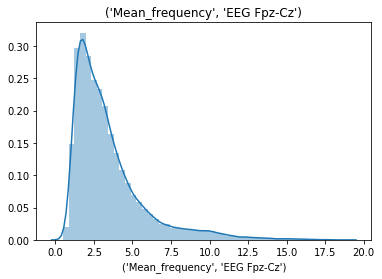

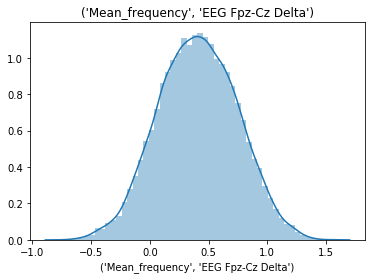

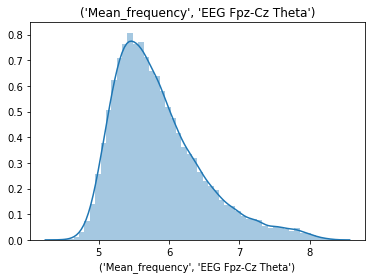

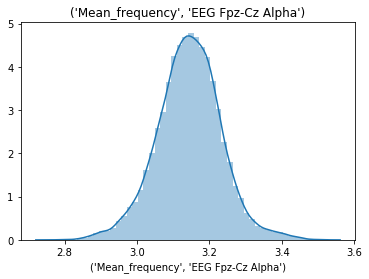

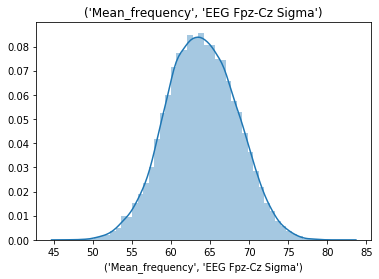

...

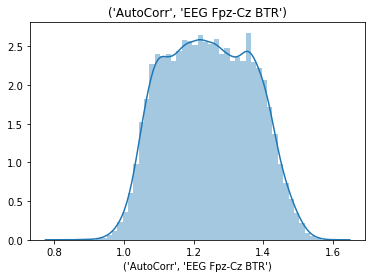

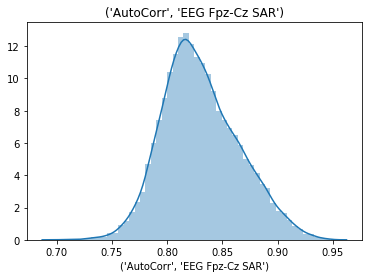

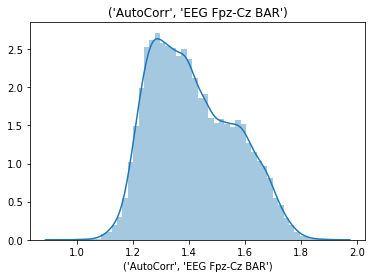

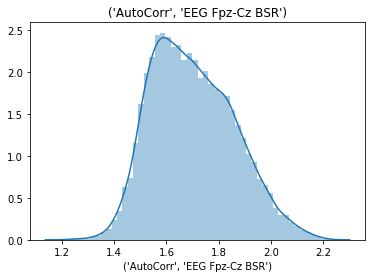

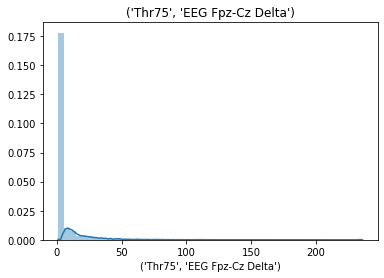

In [52]:
results_dir = 'C:/Users/vita7/OneDrive/Documents/Github/EEG_SleepStage_Analysis/KDE/'

if not os.path.isdir(results_dir): 
    os.makedirs(results_dir)

# Dist + KDE
for col in list(train_X.columns):
    sns.distplot(train_X[col])
    plt.title(col)
    plt.savefig(results_dir + str(col) + '_KDE.png')
    plt.show()

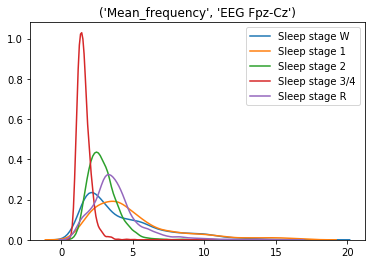

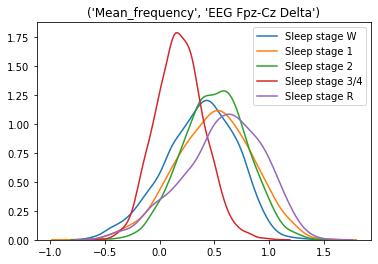

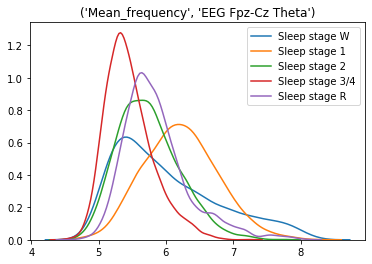

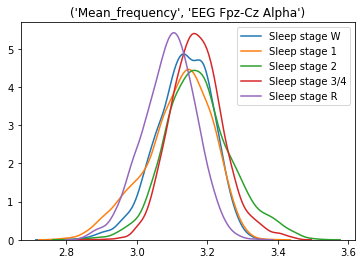

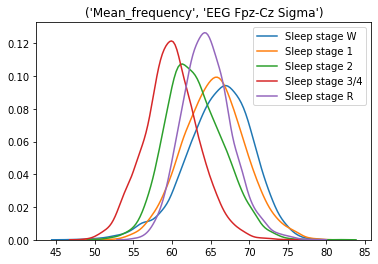

...

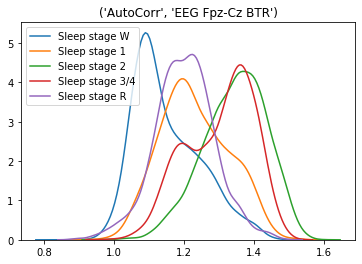

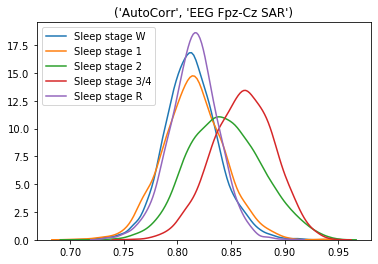

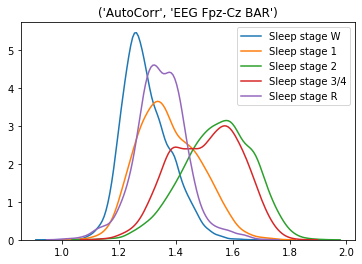

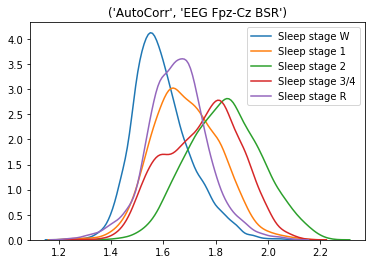

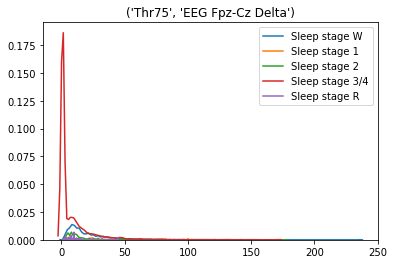

In [53]:
results_dir = 'C:/Users/vita7/OneDrive/Documents/Github/EEG_SleepStage_Analysis/Stage_KDE/'

if not os.path.isdir(results_dir): 
    os.makedirs(results_dir)

for col in list(train_X.columns):
    plt.title(col)
    for stage in list(event_id.keys()):
        sns.kdeplot(df[df['condition'] == stage][col], label=stage)
    plt.savefig(results_dir + str(col) + '_stage_KDE.png')
    plt.show()

### Correlation matrix

results_dir = 'C:/Users/vita7/OneDrive/Documents/Github/EEG_SleepStage_Analysis/Correlation matrix/'

if not os.path.isdir(results_dir): 
    os.makedirs(results_dir)
    
for col in tr_df.columns.get_level_values(1).unique()[1:]:
    df_corr = tr_df.xs(col,level=1,axis=1)[['Mean_frequency','SpectEn']].corr()
    plt.figure()
    plt.title(col)
    sns.heatmap(df_corr,annot=True)
    plt.savefig(results_dir + str(col) + '_Correlation matrix.png')
    